In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv('E:/Class Notes/jillu mam/ML/KNN/2 Project/Market Positioning of Mobile/Dataset/Mobile_data.csv')
df.head()

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range
0,842,2.2,1,7,0.6,188,2,2,20,756,2549,9,7,19,1
1,1021,0.5,0,53,0.7,136,3,6,905,1988,2631,17,3,7,2
2,563,0.5,2,41,0.9,145,5,6,1263,1716,2603,11,2,9,2
3,615,2.5,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,2
4,1821,1.2,13,44,0.6,141,2,14,1208,1212,1411,8,2,15,1


In [6]:
df.isnull().sum().sum() == 0

True

In [4]:
df.describe()

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,1.522250,4.309500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,1.500000
std,439.418206,0.816004,4.341444,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,1.118314
min,501.000000,0.500000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000
25%,851.750000,0.700000,1.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,0.750000
50%,1226.000000,1.500000,3.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.500000
75%,1615.250000,2.200000,7.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,2.250000
max,1998.000000,3.000000,19.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,3.000000


<AxesSubplot: >

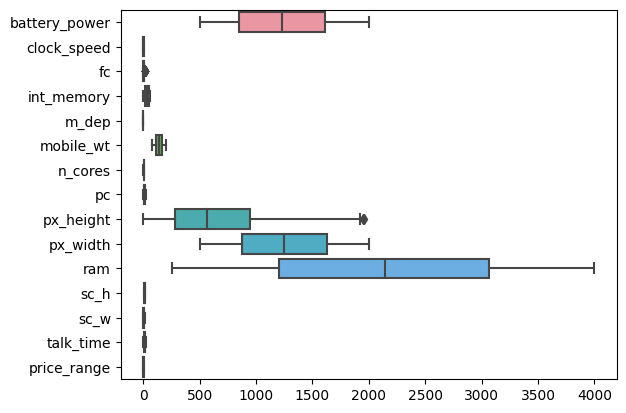

In [9]:
sns.boxplot(data=df,orient="h")

In [11]:
#Ste0p1 : Calculate the IQR
df_iqr=df
Q1=df_iqr.quantile(0.25)
Q3=df_iqr.quantile(0.75)
IQR=Q3-Q1
print(IQR)

battery_power     763.50
clock_speed         1.50
fc                  6.00
int_memory         32.00
m_dep               0.60
mobile_wt          61.00
n_cores             4.00
pc                 10.00
px_height         664.50
px_width          758.25
ram              1857.00
sc_h                7.00
sc_w                7.00
talk_time          10.00
price_range         1.50
dtype: float64


In [12]:
df_out=df_iqr[~((df_iqr<(Q1-1.5*IQR))|(df_iqr>(Q3+1.5*IQR))).any(axis=1)]
print("The no.of rows before outlir filtering was:",df_iqr.shape)
print("The no.of rows before outlir filtering was:",df_out.shape)

The no.of rows before outlir filtering was: (2000, 15)
The no.of rows before outlir filtering was: (1980, 15)


In [14]:
corr=df_out.corr()
corr

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range
battery_power,1.000000,0.010136,0.020317,-0.008197,0.034834,0.002575,-0.026451,0.025013,0.014290,-0.008205,-0.000121,-0.023784,-0.016533,0.047909,0.200763
clock_speed,0.010136,1.000000,-0.006342,0.004461,-0.011400,0.011939,-0.005638,-0.009017,-0.011326,-0.009050,0.004628,-0.026876,-0.005777,-0.010122,-0.006120
fc,0.020317,-0.006342,1.000000,-0.025745,0.004310,0.014011,-0.001971,0.635564,-0.027777,-0.012505,0.019440,0.000372,-0.001778,-0.008136,0.021120
int_memory,-0.008197,0.004461,-0.025745,1.000000,0.006426,-0.030009,-0.026662,-0.030888,0.009328,-0.011010,0.033712,0.039791,0.012055,-0.010334,0.043458
m_dep,0.034834,-0.011400,0.004310,0.006426,1.000000,0.018595,-0.003834,0.030108,0.024797,0.022394,-0.011402,-0.027314,-0.019880,0.015418,-0.000925
mobile_wt,0.002575,0.011939,0.014011,-0.030009,0.018595,1.000000,-0.018240,0.013121,-0.000223,-0.000128,-0.004555,-0.032044,-0.019790,0.010434,-0.031628
n_cores,-0.026451,-0.005638,-0.001971,-0.026662,-0.003834,-0.018240,1.000000,0.004900,-0.003893,0.025602,0.008277,-0.002913,0.024048,0.015609,0.008307
pc,0.025013,-0.009017,0.635564,-0.030888,0.030108,0.013121,0.004900,1.000000,-0.025150,0.001728,0.031317,0.011671,-0.017581,0.015342,0.033871
px_height,0.014290,-0.011326,-0.027777,0.009328,0.024797,-0.000223,-0.003893,-0.025150,1.000000,0.506294,-0.024568,0.055978,0.036888,-0.011667,0.144277
px_width,-0.008205,-0.009050,-0.012505,-0.011010,0.022394,-0.000128,0.025602,0.001728,0.506294,1.000000,0.003795,0.018325,0.031277,0.004499,0.165132


In [15]:
df.columns

Index(['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep',
       'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h',
       'sc_w', 'talk_time', 'price_range'],
      dtype='object')

<AxesSubplot: xlabel='price_range', ylabel='battery_power'>

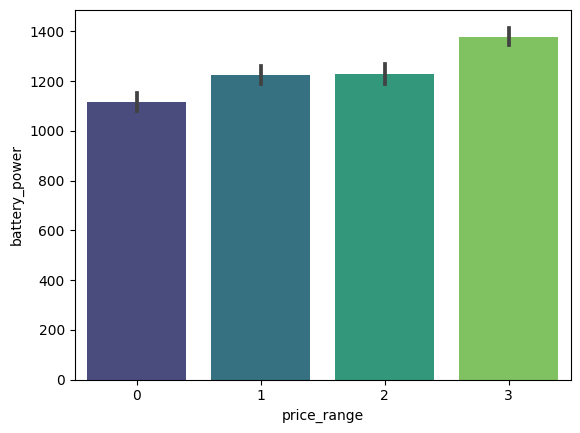

In [16]:
sns.barplot(data=df_out,y='battery_power',x='price_range',palette='viridis')

<AxesSubplot: xlabel='price_range', ylabel='int_memory'>

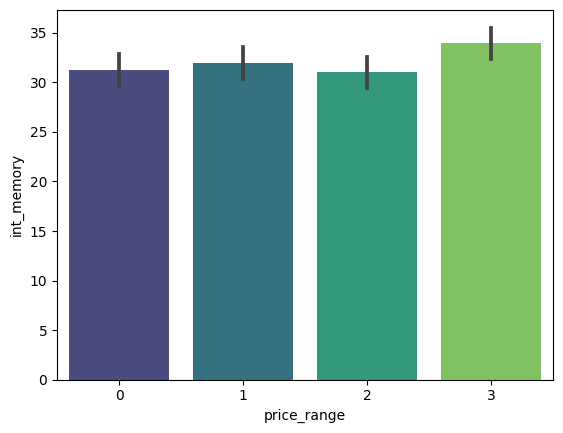

In [17]:
sns.barplot(data=df_out,y='int_memory',x='price_range',palette='viridis')

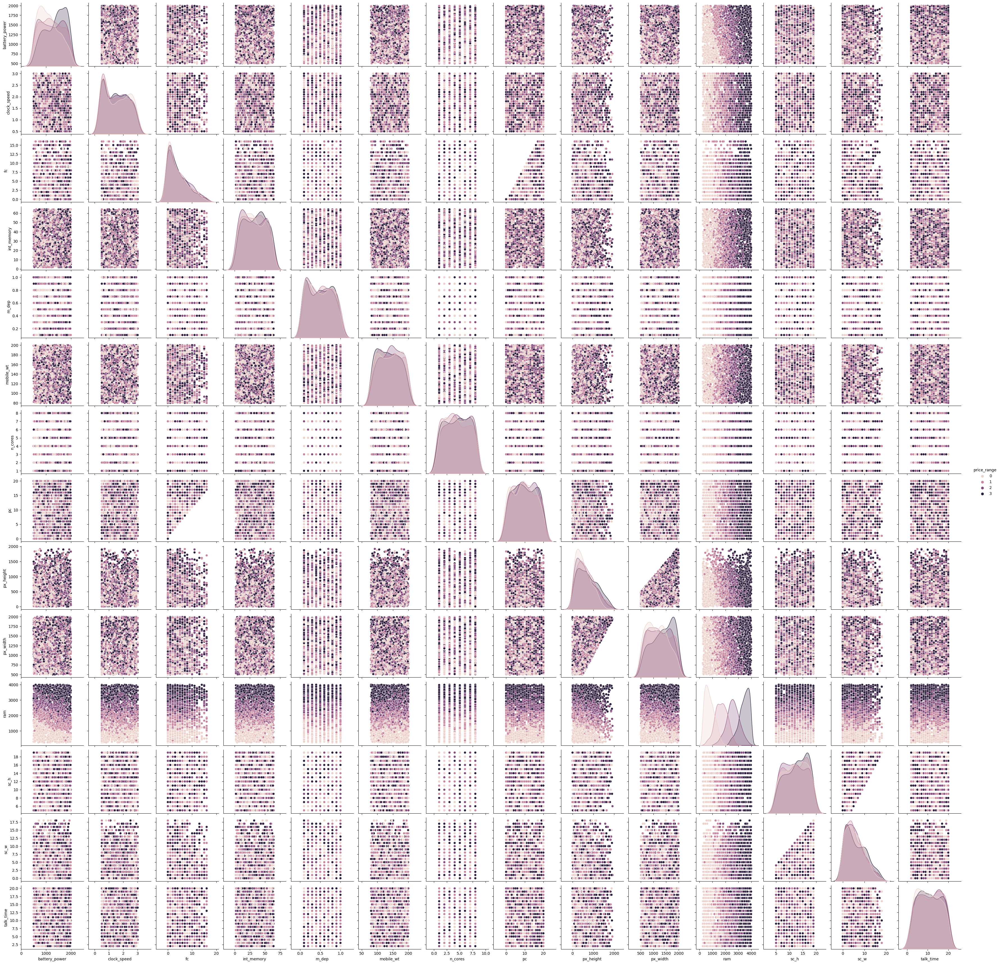

In [18]:
sns.pairplot(df_out,hue='price_range')

In [28]:
from sklearn.preprocessing import MinMaxScaler


In [20]:
scaler=MinMaxScaler()

In [21]:
x=df_out.drop(['price_range'],axis=1)
y=df_out['price_range']


In [29]:
X=scaler.fit_transform(x)

In [31]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [32]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn=KNeighborsClassifier()
param_grid={'n_neighbors':np.arange(1,10)}
knn_gscv=GridSearchCV(knn,param_grid,cv=5)
knn_gscv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([1, 2, 3, 4, 5, 6, 7, 8, 9])})

In [33]:
knn_gscv.best_params_

{'n_neighbors': 8}

In [34]:
knn_gscv.best_score_

0.6079383460448029

Another Method beacause score is 0.6

In [37]:
from sklearn.feature_selection import SelectKBest


In [38]:
from sklearn.feature_selection import mutual_info_classif




In [39]:
X_new=SelectKBest(mutual_info_classif,k=5).fit_transform(X,y)

In [40]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)


In [41]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn=KNeighborsClassifier()
param_grid={'n_neighbors':np.arange(1,10)}
knn_gscv=GridSearchCV(knn,param_grid,cv=5)
knn_gscv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([1, 2, 3, 4, 5, 6, 7, 8, 9])})

In [42]:
knn_gscv.best_params_

{'n_neighbors': 7}

In [43]:
knn_gscv.best_score_

0.8428003833406541